Import

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.datasets as datasets
from torchvision.transforms import transforms
import os

In [ ]:
!pip install kaggle

In [ ]:
import json
import os
kaggle_dictionary=json.load(open('kaggle.json'))
os.environ['KAGGLE_USERNAME']=kaggle_dictionary['username']
os.environ['KAGGLE_KEY']=kaggle_dictionary['key']

In [ ]:
!kaggle datasets download badasstechie/celebahq-resized-256x256

Dataset URL: https://www.kaggle.com/datasets/badasstechie/celebahq-resized-256x256
License(s): GPL-2.0
 87% 246M/283M [00:00<00:00, 674MB/s] 
100% 283M/283M [00:05<00:00, 57.8MB/s]


In [ ]:
from zipfile import ZipFile
with ZipFile('/content/celebahq-resized-256x256.zip','r') as zip:
    zip.extractall()

In [ ]:
device=torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

Parameters

In [ ]:
image_size=64
batch_size=64
epochs=100
learning_rate=0.0002
latent_dim=100

Dataset

In [ ]:

transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [ ]:
!mkdir /content/celeba_hq_256/all_images
!mv /content/celeba_hq_256/*.jpg /content/celeba_hq_256/all_images/
!mv /content/celeba_hq_256/*.png /content/celeba_hq_256/all_images/

mkdir: cannot create directory ‘/content/celeba_hq_256/all_images’: File exists
mv: cannot stat '/content/celeba_hq_256/*.jpg': No such file or directory
mv: cannot stat '/content/celeba_hq_256/*.png': No such file or directory


In [ ]:
train_data=datasets.ImageFolder(root="/content/celeba_hq_256",transform=transform)

In [ ]:
train_loader=DataLoader(train_data,batch_size=batch_size,shuffle=True,pin_memory=True)

In [ ]:
train_loader

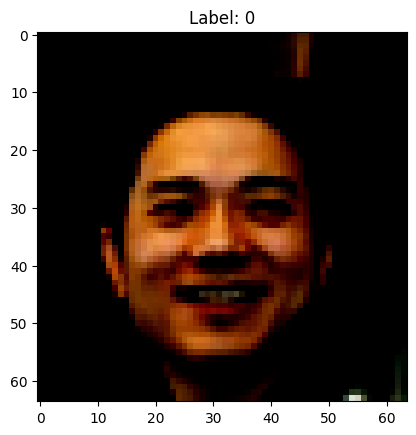

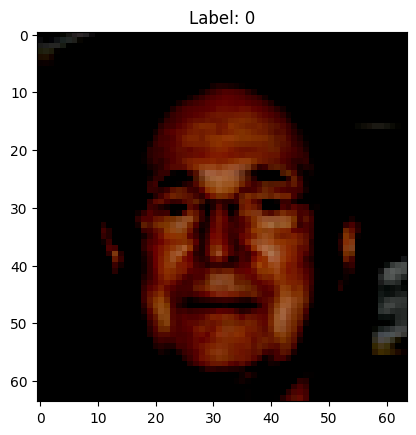

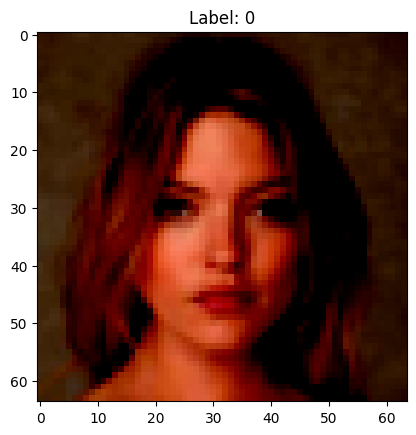

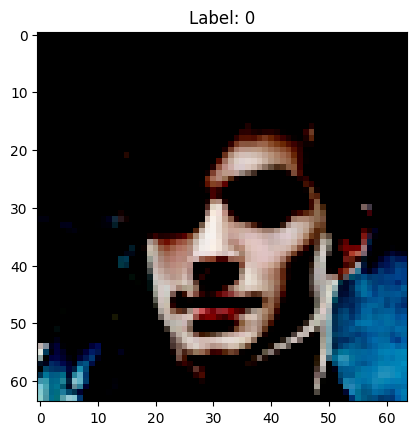

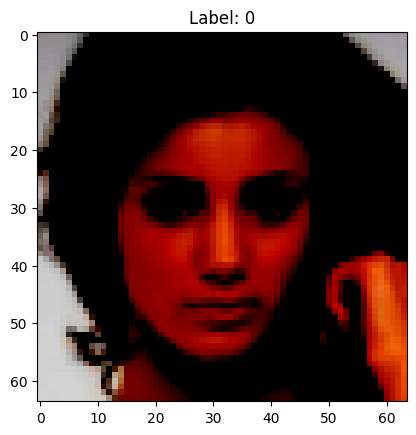

In [ ]:
import matplotlib.pyplot as plt

for i in range(5):
    image, label = train_data[i]
    plt.imshow(image.permute(1, 2, 0))
    plt.title(f"Label: {label}")
    plt.show()

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [ ]:
class Discriminator(nn.Module):
  def __init__(self,features):
    super().__init__()
    self.disc=nn.Sequential(
        nn.Conv2d(3,64,4,2,1,bias=False),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Conv2d(64,128,4,2,1,bias=False),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Conv2d(128,256,4,2,1,bias=False),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Conv2d(256,512,4,2,1,bias=False),
        nn.BatchNorm2d(512),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Conv2d(512,1,4,1,0,bias=False),
        nn.Sigmoid()
    )
  def forward(self,x):
    return self.disc(x)

In [ ]:
class Generator(nn.Module):
  def __init__(self,latent_dim,img_dim):
    super().__init__()
    self.gen=nn.Sequential(
        nn.ConvTranspose2d(latent_dim,512,4,1,0,bias=False),
        nn.BatchNorm2d(512),
        nn.ReLU(),

        nn.ConvTranspose2d(512,256,4,2,1,bias=False),
        nn.BatchNorm2d(256),
        nn.ReLU(),

        nn.ConvTranspose2d(256,128,4,2,1,bias=False),
        nn.BatchNorm2d(128),
        nn.ReLU(),

        nn.ConvTranspose2d(128,64,4,2,1,bias=False),
        nn.BatchNorm2d(64),
        nn.ReLU(),

        nn.ConvTranspose2d(64,3,4,2,1,bias=False),
        nn.Tanh()
    )
  def forward(self,x):
    return self.gen(x)

In [ ]:
generator=Generator(latent_dim,image_size).to(device)
generator.apply(weights_init)
print(generator)

Generator(
  (gen): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [ ]:
discriminator=Discriminator(image_size).to(device)
discriminator.apply(weights_init)
print(discriminator)

Discriminator(
  (disc): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [ ]:
criterion=nn.BCELoss()
optim_gen=optim.Adam(generator.parameters(),lr=learning_rate, betas=(0.5, 0.999))
optim_disc=optim.Adam(discriminator.parameters(),lr=learning_rate, betas=(0.5, 0.999))

In [ ]:
noise=torch.randn(batch_size,latent_dim,1,1).to(device)

In [ ]:
fixed_noise = torch.randn(batch_size, latent_dim,1,1).to(device)

Training Loop

In [ ]:
from torch.utils.tensorboard import SummaryWriter
from torchvision.utils import make_grid

In [ ]:
len(train_loader)

469

In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
%tensorboard --logdir runs/


Reusing TensorBoard on port 6006 (pid 6658), started 0:07:37 ago. (Use '!kill 6658' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
writer = SummaryWriter()
for epoch in range(epochs):
  total_loss_d = 0.0
  total_loss_g = 0.0
  num_batches = len(train_loader)
  for batch,(real_img,_) in enumerate(train_loader):
    real_img=real_img.to(device)
    batch_size=real_img.shape[0]

    real_labels=torch.ones((batch_size,1)).to(device)* 0.9
    fake_labels=torch.zeros((batch_size,1)).to(device)

    #Training discriminator
    noise=torch.randn(batch_size,latent_dim,1,1).to(device)
    fake_img=generator(noise)
    disc_real=discriminator(real_img)
    disc_real = disc_real.view(-1, 1)
    disc_fake=discriminator(fake_img.detach())
    disc_fake=disc_fake.view(-1,1)
    loss_real=criterion(disc_real,real_labels)
    loss_fake=criterion(disc_fake,fake_labels)
    loss_disc=(loss_real+loss_fake)/2
    discriminator.zero_grad()
    loss_disc.backward()
    optim_disc.step()
    total_loss_d += loss_disc.item()
    #Training generator

    output=discriminator(fake_img).view(-1,1)
    loss_gen=criterion(output,real_labels)
    generator.zero_grad()
    loss_gen.backward()
    optim_gen.step()
    total_loss_g += loss_gen.item()
  avg_loss_d = total_loss_d / num_batches
  avg_loss_g = total_loss_g / num_batches
  print(f"Epoch [{epoch+1}/{epochs}]  Loss_D: {avg_loss_d:.4f}  Loss_G: {avg_loss_g:.4f}")
  writer.add_scalar('Loss/Discriminator', avg_loss_d, epoch)
  writer.add_scalar('Loss/Generator', avg_loss_g, epoch)
  with torch.no_grad():
    samples = generator(fixed_noise)
    grid = make_grid(samples.view(-1, 3, 64, 64), nrow=8, normalize=True)
    writer.add_image('Generated Images', grid, epoch)
writer.close()

Epoch [1/100]  Loss_D: 0.3843  Loss_G: 4.2073
Epoch [2/100]  Loss_D: 0.3828  Loss_G: 3.8899
Epoch [3/100]  Loss_D: 0.3773  Loss_G: 3.5453
Epoch [4/100]  Loss_D: 0.3776  Loss_G: 3.3841
Epoch [5/100]  Loss_D: 0.4119  Loss_G: 3.0534
